# Assignment 1:  Superpixels and Image Segmentation.

Name: ****

UID:  ** **

Link to Google Drive : ****

Please submit a PDF containing all outputs to gradescope by **October 5, 11:59pm**

----------------------------

In this assignment, you will learn about superpixels. You will first generate superpixels by clustering pixels via k-means. This will generate a superpixel map such as the following:

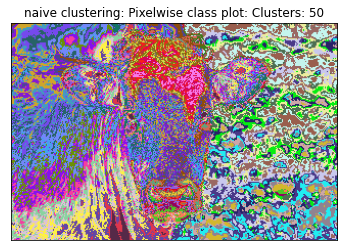

You will then implement a better superpixel algorithm: SLIC, which lets you generate superpixel maps like the following:

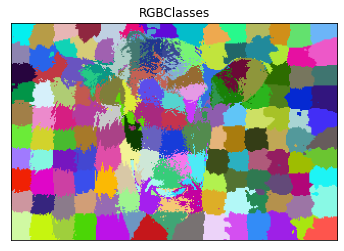

You will then build a segmentation network by training a deep neural network on your superpixels. This part is fairly open-ended, feel free to try any model you can think of (GNN, CNN, Transformer, etc.).

To give an example, for a CNN-based system that reformulates segmentation as superpixel image classification, there are basically three steps in the training stage:

1. Dilate and save each superpixel region from SLIC output into image of size 224X224, alongwith the ground truth segments label.
2. Build a couple of convolution layers to extract the deep features from each Superpixel patch image. Let the last layer be Fully connected layers.
3. Define the segmentation loss as multi-class classification loss and train a convolutional neural network based classifier.

Then, during inference, you would combine the classifier's predicted labels to form the whole input image's Superpixel segmentation results.

## Part 1: Superpixels

For this first part of the assignment, you will implement 2 superpixels methods: k-means pixel clustering, and SLIC.

### Data

First, we download the MSRC labeled imaged database.

In [ ]:
!wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
!unzip --qq msrc_objcategimagedatabase_v1.zip

--2023-10-08 17:52:35--  http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.36.245.101, 2a02:26f0:6d00:3b6::317f, 2a02:26f0:6d00:39f::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.36.245.101|:80... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip [following]
--2023-10-08 17:52:36--  https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Connecting to download.microsoft.com (download.microsoft.com)|23.36.245.101|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44119839 (42M) [application/octet-stream]
Saving to: ‘msrc_objcategimagedatabase_v1.zip’

msrc_objcategimaged 100%[===================>]  42.08M 

For the first part of this assignment, we will only use the following images. We define the list below as `im_list`.

In [ ]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

We provide the following functions as helpers for plotting your results. Please pay attention to their signatures and outputs.





In [ ]:
#All important functions to plot
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_image(im, title, xticks = [], yticks = [], isCv2 = True):
    """
    im :Image to plot
    title : Title of image
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm),
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value

    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot

    Output: None
    Creates a plot
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]

    plot_image(seg_img,title)

    return

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust}
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot:
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

For example, the following code uses `plot_image` to plot the 6 images we are using for this assignment.

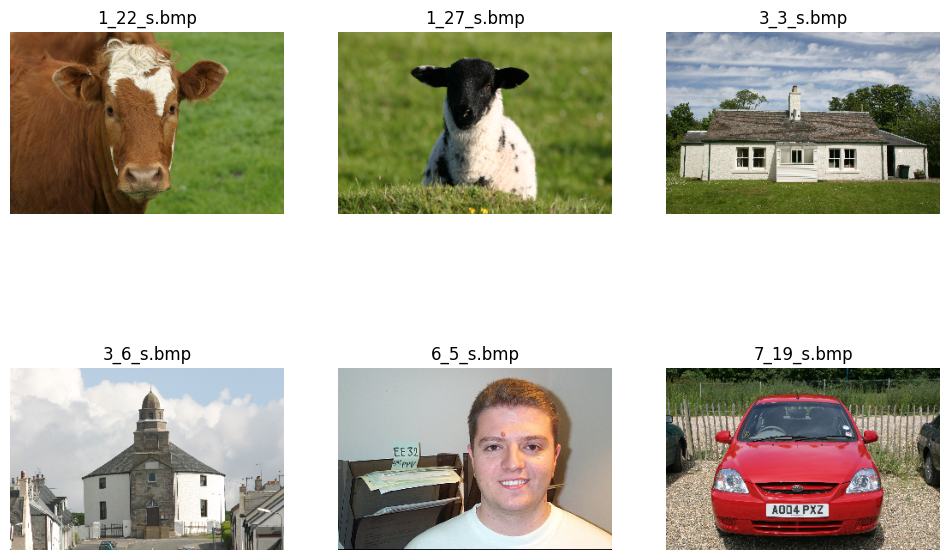

In [ ]:
list_of_images= [(cv2.imread(i), i.split("/")[-1]) for i in im_list]

#plotting_images in a grid
total_images = len(im_list)
rows = 2
cols = 3


fig, axes = plt.subplots(rows, cols, figsize=(12, 8))
for i, img_path in enumerate(im_list):
    img = cv2.imread(img_path)
    row = i // cols
    col = i % cols
    ax = axes[row, col]
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(img_path.split("/")[-1])
    ax.axis('off')

plt.show()

# for i in im_list:
#     plot_image(cv2.imread(i),i.split("/")[-1])

### Question 1: Perform k-means on image pixels `(r, g, b, x, y)`. (40 points)

The k-means clustering algorithm is an unsupervised algorithm which, for some items and for some specified number of clusters represented by cluster centers, minimizes the distance between items and their associated cluster centers. It does so by iteratively assigning items to a cluster and recomputing the cluster center based on the assigned items.

Complete the pixel clustering function. It should take input an image (shape = `(n, m, 3)`) and number of clusters. Each pixel should be represented by a vector with 3 values: `(r, g, b, x, y)`.

Then, let our provided code plot the pixelwise and superpixel plots for the cow image (`1_22_s.bmp`), using your `cluster_pixels` implementation with the provided values for the number of clusters: `5, 10, 25, 50, 150`.




In [ ]:
from sklearn.cluster import KMeans
import numpy as  np
import time

#Prepping nx5 matrix of image

def k_means_cluster(image,k):
  image=image
  h,w,d=image.shape
  vect = np.ones((h*w,5), dtype=np.float32)
  # Flatten Image
  for y in range(h):
      for x in range(w):
          vect[y * w + x] = [image[y, x, 0], image[y, x, 1], image[y, x, 2], x, y]
  #Define number of Clusters
  K = k
  #Doing Kmeans on matrix
  kmeans = KMeans(n_clusters=K,n_init=10)
  kmeans.fit(vect)

  # getting cluster, reshaping to image shape and return it
  clusters_assigned = kmeans.labels_
  seg_image = clusters_assigned.reshape(h,w)
  return seg_image

<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed tw

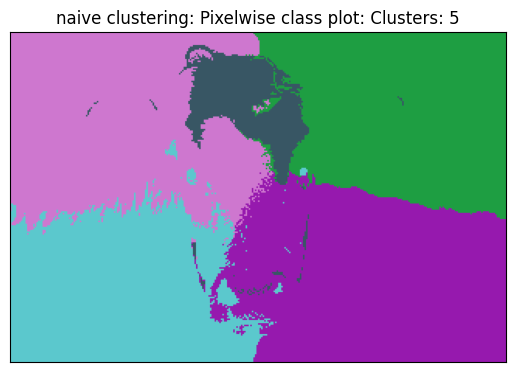

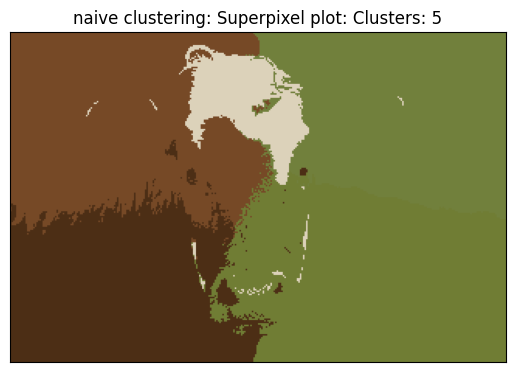

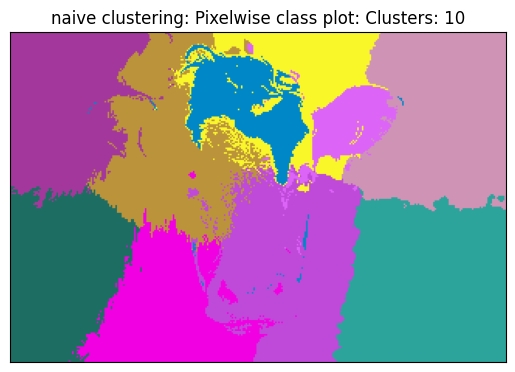

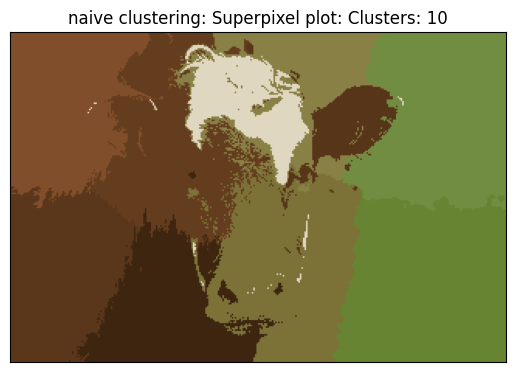

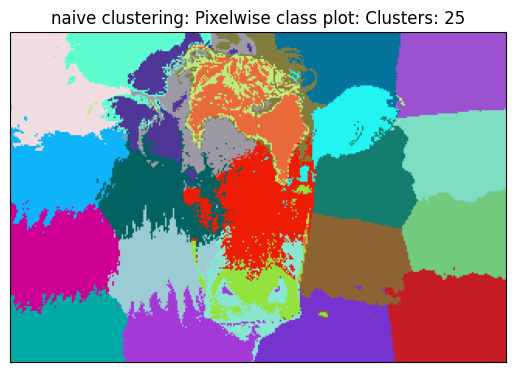

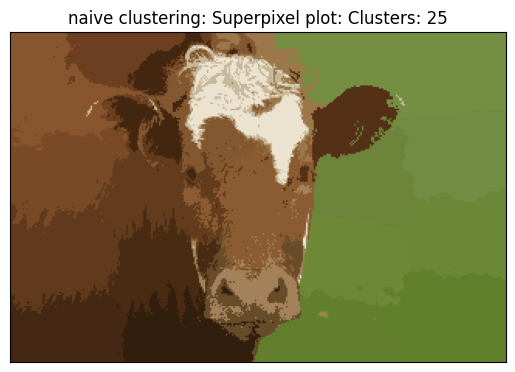

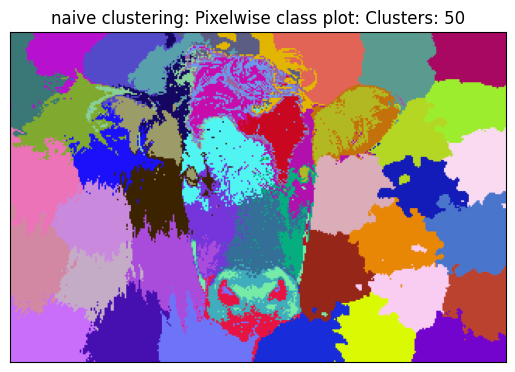

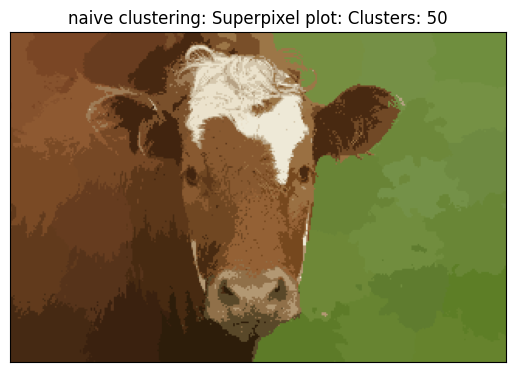

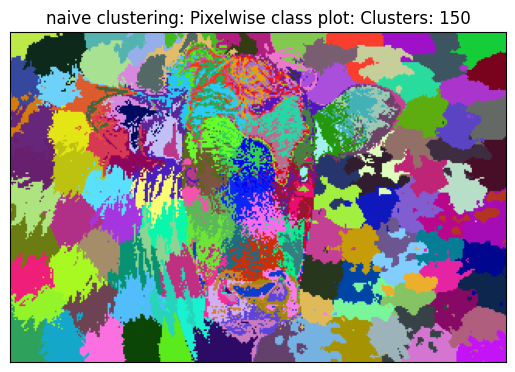

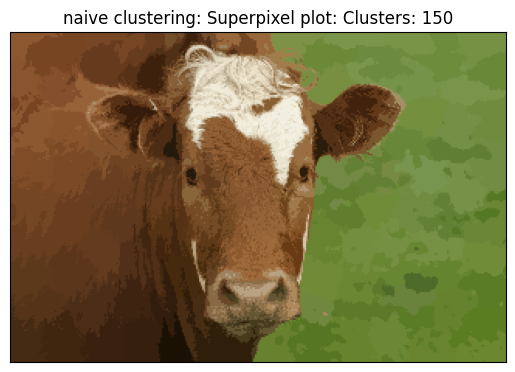

In [ ]:
def cluster_rgbxy(im,k):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    segmap=k_means_cluster(im,k)
    # assert 1==2," NOT IMPLEMENTED"
    #segmap is nXm. Each value in the 2D array is the cluster assigned to that pixel
    return segmap

im = cv2.imread(im_list[0])
for k in [5, 10, 25, 50, 150]:
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

Pick your favorite superpixel **k** value and plot results for all 6 images in `im_list`.

<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed tw

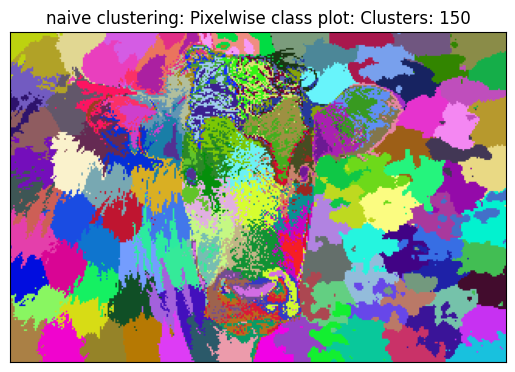

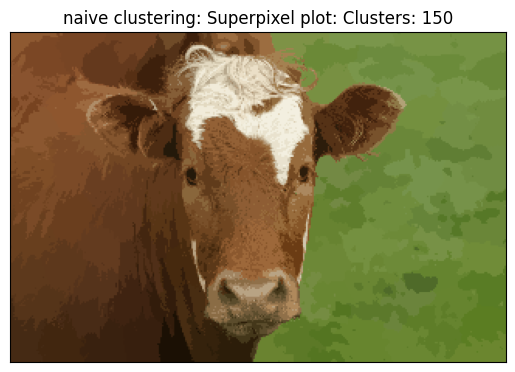

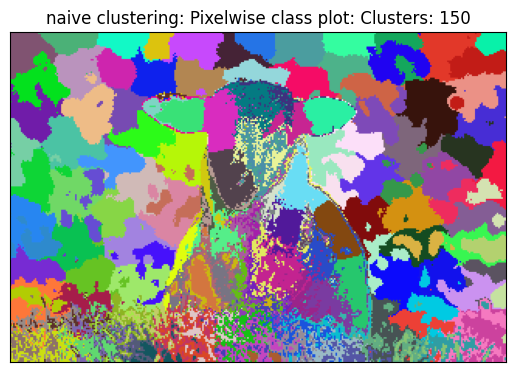

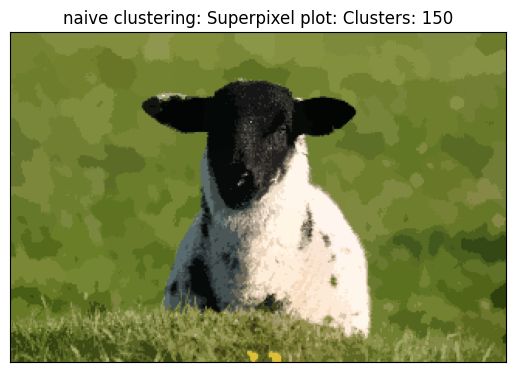

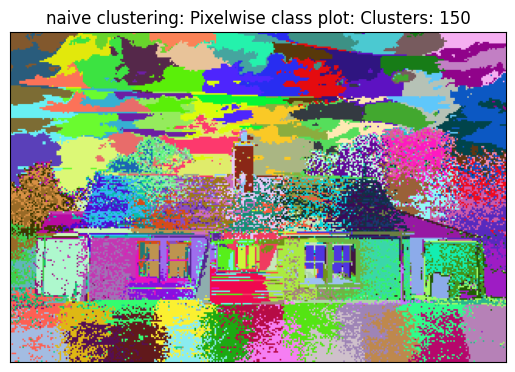

...

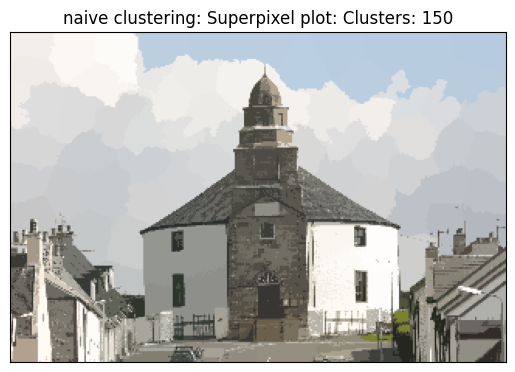

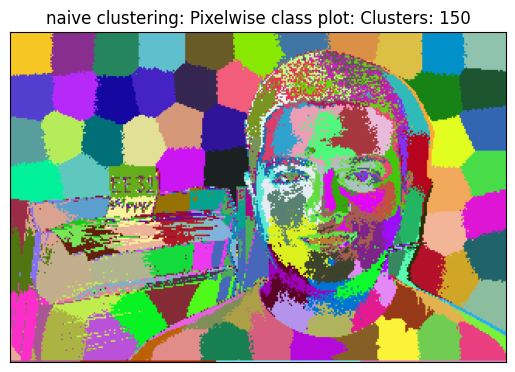

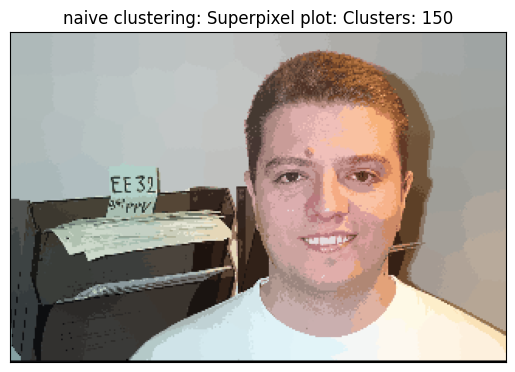

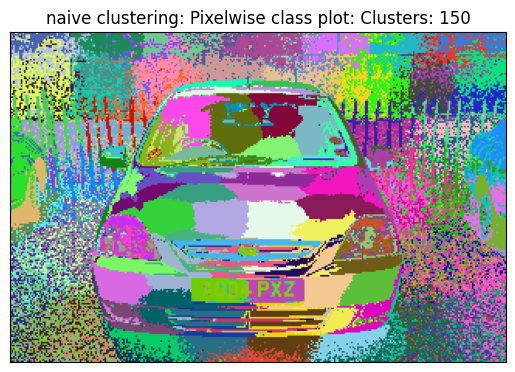

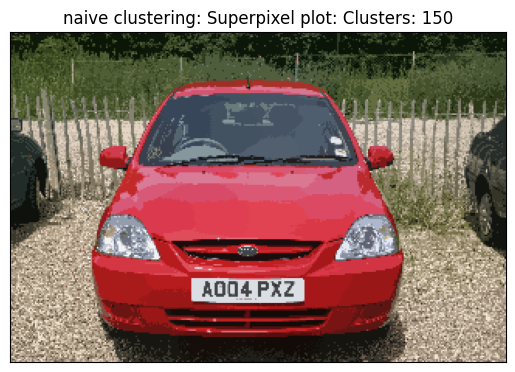

In [ ]:
# TODO: plot for 6 images with chosen k value

k=150
from google.colab.patches import cv2_imshow

for i, im_path in enumerate(im_list):
    im = cv2.imread(im_path)
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

### Question 2: Replicate SLIC and Show Results for 6 Images (50 points)

It doesn't look like we have a very favourable outcome with superpixels being implemented with simple clustering. Can we do better? Have a look at the SLIC paper [here](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Incorporate S and m and redefine your distance metric as per the paper.

**Finding an existing implementation of SLIC and using it for your assigment would be considered cheating.**

In [ ]:
import numpy as np
import  cv2

#define Class Object
class clusterobject:
    def __init__(self, colors, coordin):
        self.colors = np.array(colors) #lab in this case
        self.cluster_coordin = np.array(coordin)#y,x

# computing Cluster Gradient
def compute_grad(im,x,y):
    gradx = (np.linalg.norm(im[y, x+1] - im[y, x-1]))
    grady = (np.linalg.norm(im[y+1, x] - im[y-1, x]))
    grad = gradx**2 + grady**2
    return grad

#Creating Clusters of Image
def create_cluster(im, S):
    h,w,_=im.shape
    list_of_clusters = []
    # S-spaced grid of Clusters
    for y in range(S//2, h, S):
        for x in range(S//2, w, S):
            colors = im[y,x]
            coordin = np.array([y,x])
            #creating cluster node
            cluster = clusterobject(colors, coordin)
            # updating center with local gradient
            cluster = update_cluster(im, cluster)
            list_of_clusters.append(cluster)
    return list_of_clusters

def slic_distance(pixel, cluster_center, m, S):
    colors, cluster_coordin = pixel
    cluster_color, cluster_xy = cluster_center
    # d_c
    dc = np.linalg.norm(colors - cluster_color, ord=2)
    # d_s
    ds = np.linalg.norm(cluster_coordin - cluster_xy, ord=2)
    #Distance Measure
    Ds = np.sqrt(dc**2 + (ds**2 / S**2) * m**2)
    return Ds

#get min max of given values
def min_max(y,x,h,w,value=0,value1=0):
        y = min(max(value1, y), h-value)
        x = min(max(value1, x), w-value)
        return y,x

def update_cluster(im, clusternode):
    # check and move centers of clsuters to the lowest gradient position.
    h,w,_=im.shape
    min_grad = np.inf
    ny, nx = clusternode.cluster_coordin

    for y in range(ny-1, ny+2):
        for x in range(nx-1, nx+2):
            # ensuring pixel index is within image shape
            y,x = min_max(y,x,h,w,2,1)
            #compute gradient of pixels in cluster
            grad=compute_grad(im,x,y)
            #updating clsuter center
            if grad < min_grad:
                min_grad = grad
                clusternode.cluster_coordin = np.array([y, x])
                clusternode.colors = im[y, x]
    return clusternode

def pixel_to_cluster(im,seg_map,dist_map, list_of_clusters,S,m=10):

    # Assigning pixels of image to apt cluster by distance
    h,w,_=im.shape
    for index, cluster in enumerate(list_of_clusters):
        yc, xc = cluster.cluster_coordin.astype(np.int32)
        # Searching +s to -S
        for y in range(yc-S, yc+S):
            for x in range(xc-S, xc+S):
                # checking if pixel is in image
                y,x=min_max(y,x,h,w,1,0)

                # taking color of pixel and it's color
                colors = im[y,x]
                cluster_coordin = np.array([y,x])
                cluster_color = cluster.colors
                cluster_xy = np.array([yc,xc])

                # distance of pixel and clsuter center
                dist = slic_distance((colors, cluster_coordin), (cluster_color, cluster_xy), m, S)

                # updating distance map of image from cluster center
                if dist < dist_map[y,x]:
                    seg_map[y,x] = index + 1
                    dist_map[y,x] = dist

    return seg_map, dist_map, list_of_clusters

# getting center and color from cluster class
def get_color_center_from_node(list_of_clusters):
            new_list=[]
            for ptr in list_of_clusters:
                combined_array = np.append(ptr.colors, ptr.cluster_coordin)
                copied_array = np.copy(combined_array)
                new_list.append(copied_array)
            return new_list

In [ ]:
def run_slic(im, k, m=10, max_iter=10, thresh=6):
    #reading Image and converting to LAB
    h, w ,_= im.shape
    im = cv2.cvtColor(im.copy(), cv2.COLOR_BGR2LAB).astype(np.float64)
    N = h*w
    S = int(np.sqrt((N/k)))

    #getting list of Clusters
    list_of_clusters = create_cluster(im, S)
    iter = 0
    l1_error = np.inf

    seg_map = -1 * np.ones((h, w))
    dist_map =  np.inf * np.ones((h, w))

    y, x = np.mgrid[:im.shape[0], :im.shape[1]]
    xy_grid = np.array([x, y]).transpose(1, 2, 0).astype(np.float32)

    #cycling withing image till L1 error goes below threshold
    while not l1_error<=thresh and iter < max_iter:

        #saving cluster before update
        old_cluster=get_color_center_from_node(list_of_clusters)
        #mapping pixel to clsuters
        seg_map, dist_map, list_of_clusters = pixel_to_cluster(im, seg_map, dist_map, list_of_clusters,S,m) # Step 4-6
        #updating clsuter with mean color after udapting center
        updated_cluster = []
        for index, cluster in enumerate(list_of_clusters):
            # getting pixels of current cluster
            colors = im[seg_map == index+1]
            cluster_coordin = xy_grid[seg_map == index+1]
            # update color, xy
            cluster.colors = colors.mean(axis=0)
            cluster.cluster_coordin = cluster_coordin.mean(axis=0)
            updated_cluster.append(cluster)
        list_of_clusters=updated_cluster

        #getting current clusters to check error
        current_cluster=get_color_center_from_node(list_of_clusters)

        #L1 error
        l1_error = np.linalg.norm((np.array(current_cluster) - np.array(old_cluster)), ord=1)
        iter=iter+1

    return seg_map

In [ ]:
############Algorithm############
#Compute grid steps: S
#you can explore different values of m
#initialize cluster centers [l,a,b,x,y] using
#Perturb for minimum G
#while not converged
##for every pixel:
####  compare distance D_s with each cluster center within 2S X 2S.
####  Assign to nearest cluster
##calculate new cluster center


def SLIC(im, k):
    """
    Input arguments:
    im: image input
    k: number of cluster segments


    Compute
    S: As described in the paper
    m: As described in the paper (use the same value as in the paper)
    follow the algorithm..

    returns:
    segmap: 2D matrix where each value corresponds to the image pixel's cluster number
    """
    return run_slic(im, k)


With SLIC implemented, plot results for all 6 images.

<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)


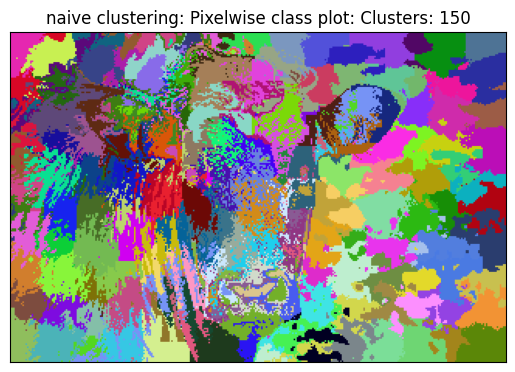

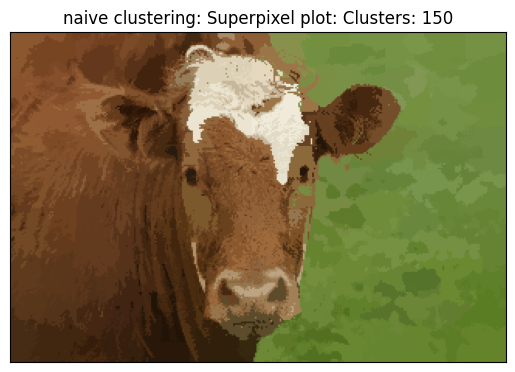

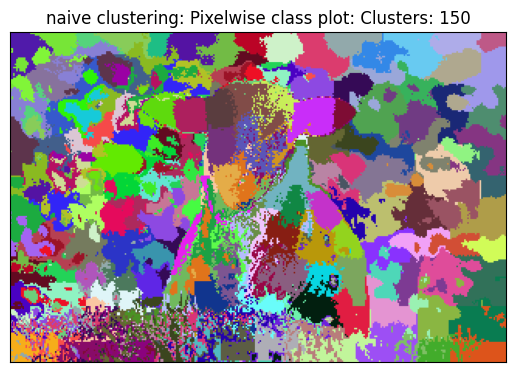

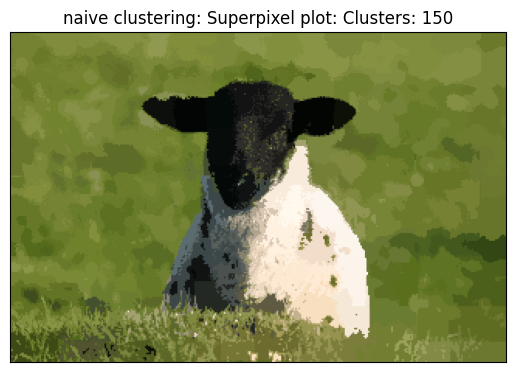

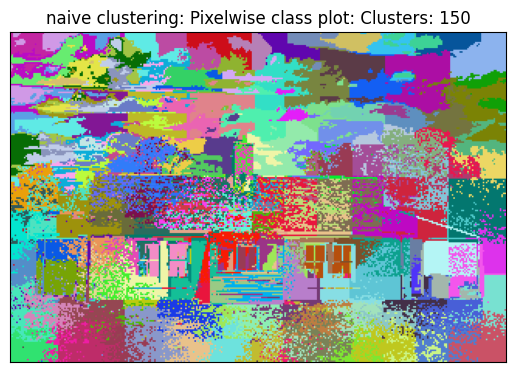

...

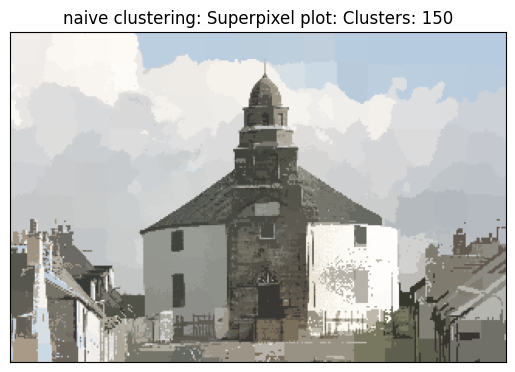

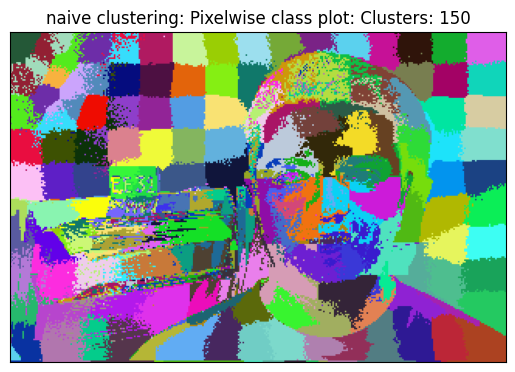

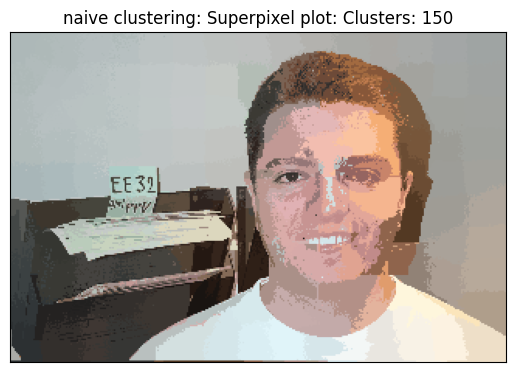

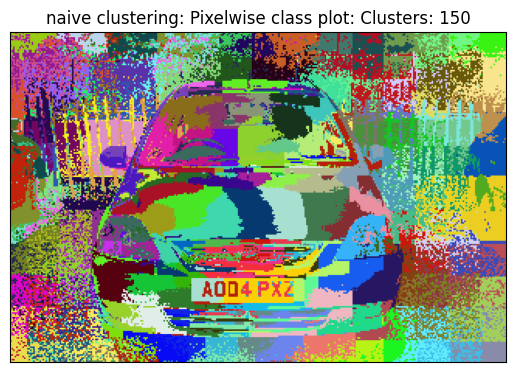

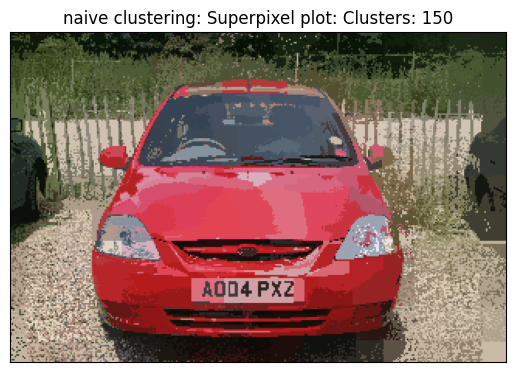

In [ ]:
## TODO: Call our plot functions with your SLIC results for all 6 images
k=150
for i, im_path in enumerate(im_list):
    im = cv2.imread(im_path)
    seg_map = SLIC(im, k=k)
    _ = rgb_segment(seg_map,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,seg_map,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

### Question 3: What advantage did the SLIC give compared to `(r, g, b, x, y)`? Please answer in 3 sentences or fewer. (10 points)

*Your* Answer: SLIC can run faster compared to K_means when properly optimised.K-means is flexible in allowing use to rgb or include spatial info whereas SLIC is always 5D. SLIC also appears to be more robust to noise in images.

### Bonus Question 4: Enforce connectivity (20 points, OPTIONAL)
There are many superpixels which are very small and disconnected from each other. Merge them with larger superpixels

O(N) algorithm:
1. Set minimum size of superpixel
2. If region smaller than threshold, assign to nearest cluster

Plot results for the 6 images.


## Part 2: Segmentation

For this part, you will use your best superpixels to build an image segmentation system. Alternatively, you can use SLIC from some library, as we demonstrate in the Data section that follows.

### Data

This is mostly the same as the last part, except now we also need to consider the annotated ground truth segmentation maps.

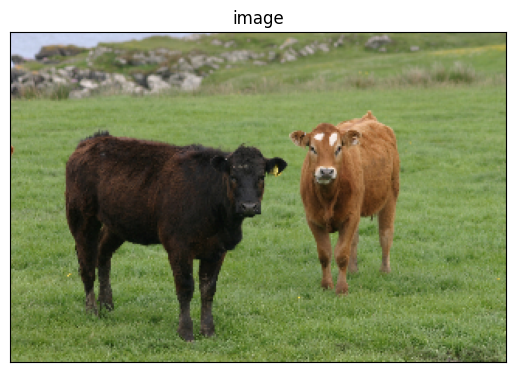

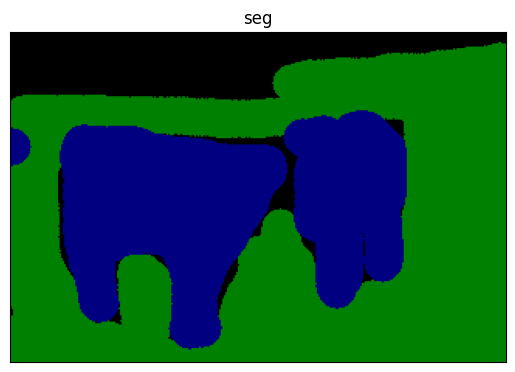

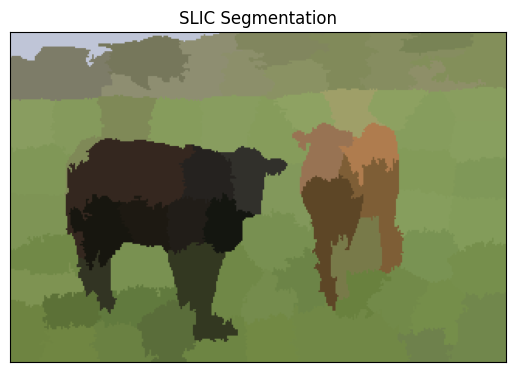

In [ ]:
#  plot a sample image and its ground truth segments
image_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s.bmp')
seg_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s_GT.bmp')
plot_image(image_sample, 'image')
plot_image(seg_sample, 'seg')

#  run SLIC on the sample image and plot the corresponding SLIC segments
from skimage.segmentation import slic

segments_sample = slic(image_sample, n_segments=100, compactness=10)
superpixel_plot(image_sample, segments_sample, title = "SLIC Segmentation")

In [ ]:
from IPython import embed
import os
current_directory = os.getcwd()
msrc_directory = current_directory + '/MSRC_ObjCategImageDatabase_v1'

#Superpixel dataset preparation

# from Dataset_v1
SEG_LABELS_LIST_v1 = [
    {"id": -1, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 5,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 6, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 7, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 8, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": -1, "name": "horse",       "rgb_values": [128,   0,    128]},
    {"id": -1, "name": "water",       "rgb_values": [64,   128,    0]},
    {"id": -1, "name": "mountain",       "rgb_values": [64,   0,    0]},
    {"id": -1, "name": "sheep",       "rgb_values": [0,   128,    128]}]

# from Dataset_v2
SEG_LABELS_LIST_v2 = [
    {"id": -1, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "horse",      "rgb_values": [128, 0,    128]},
    {"id": 5,  "name": "sheep",      "rgb_values": [0,   128,  128]},
    {"id": 6,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 7,  "name": "mountain",   "rgb_values": [64,  0,    0]},
    {"id": 8,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 9,  "name": "water",      "rgb_values": [64,  128,  0]},
    {"id": 10, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 11, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 12, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": 13, "name": "flower",     "rgb_values": [64,  128,  128]},
    {"id": 14, "name": "sign",       "rgb_values": [192, 128,  128]},
    {"id": 15, "name": "bird",       "rgb_values": [0,   64,   0]},
    {"id": 16, "name": "book",       "rgb_values": [128, 64,   0]},
    {"id": 17, "name": "chair",      "rgb_values": [0,   192,  0]},
    {"id": 18, "name": "road",       "rgb_values": [128, 64,   128]},
    {"id": 19, "name": "cat",        "rgb_values": [0,   192,  128]},
    {"id": 20, "name": "dog",        "rgb_values": [128, 192,  128]},
    {"id": 21, "name": "body",       "rgb_values": [64,  64,   0]},
    {"id": 22, "name": "boat",       "rgb_values": [192, 64,   0]}]

# create a map rgb_2_label, where mapping the ground truth 3-d array segmentation into a single ID label.
rgb_2_label = {}
for i in SEG_LABELS_LIST_v1:
    rgb_2_label[tuple(i['rgb_values'])] = i['id']

### Question 5: Superpixel Dataset (30 points)

First, we dilate each superpixel and save the output superpixel patch from SLIC into 224X224 size image (after rescaling), alongwith the ground truth segments label.

For the purpose of consistency, we adopt the existing SLIC implementation from the scikit-learn machine learning package.

Suggested algorithm: Save the superpixels along with their segmentation class. You could implement this as follows:

For each image
1. Get superpixels sp_i for image x. We adopt 100 segments in this assignment, 'segments = slic(image, n_segments=100, compactness=10)'.
2. For every superpixel sp_i in the image, \\
    2.1. find the smallest rectangle which can enclose sp_i <br>
    2.2. Dilate the rectangle by 3 pixels.<br>
    2.3. Get the same region from the segmentation image (from the file with similar name with *_GT). The class for this sp_i is mode of segmentation classes in that same region. Save the dilated region as npy (jpg is lossy for such small patches).<br>


Alternatively, you could create a single csv with columns segment patch location, class label for each sp_i of each image.<br>italicized text

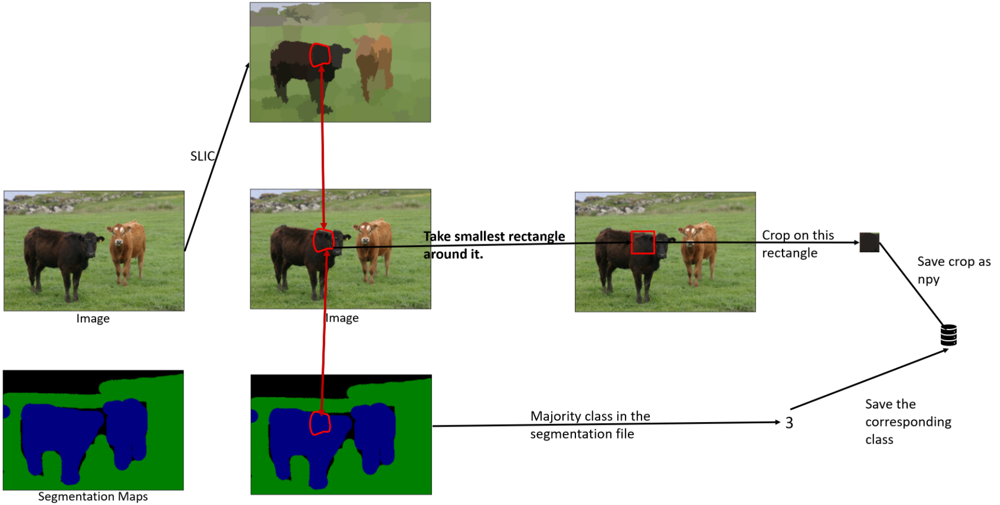


In addition to your code, **the primary graded deliverables** for this question are the 12 demo images we request after you have written code for the dataset.

In [ ]:
# run SLIC on each original images and save the (segment patch, ID label) pair
# segments = slic(image, n_segments=100, compactness=10)
# it may take up to half an hour to process, depending on the hardware resources
# save the output file names to train.txt
# Alternatively, you don't save the segment patch and ID label offline, instead,
# you process them on the fly later.

if os.path.exists('./datasets/train.txt'):
    os.remove('./datasets/train.txt')

for filename in os.listdir(msrc_directory):
    # Your code
    pass

In [ ]:
#importing all packages
from pathlib import Path
from skimage.segmentation import slic
from skimage.io import imsave
import pandas as pd
import os
import cv2
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import copy
from google.colab.patches import cv2_imshow
#To delete dataset folder if needed
# import shutil
# folder_path = '/content/MSRC_ObjCategImageDatabase_v1/datasets/'
# shutil.rmtree(folder_path)

In [ ]:
#Making dataset dir
curr_dir = os.getcwd()
source_dir=current_directory+'/MSRC_ObjCategImageDatabase_v1'
dir=Path(source_dir)
dataset_dir= source_dir+"/datasets/"
train_dir=source_dir+'/datasets/train/'
test_dir=source_dir+'/datasets/test/'
if not os.path.exists(source_dir+'/datasets/'):
    os.mkdir(source_dir+'/datasets/')
    os.mkdir(train_dir)
    os.mkdir(test_dir)
    print("Train and Test Dataset Dir Made")

#getting list of images and gt images
image_list=sorted([str(file) for file in dir.glob('*s.bmp')])
gt_list=sorted([str(file) for file in dir.glob('*s_GT*')])

# changing -1 class to 9
new_label= copy.deepcopy(rgb_2_label)
for key, value in rgb_2_label.items():
    if value == -1:
        new_label[key] = 9
print("Updated RGB labels")

#getting each pixel valie of every class
label_2_rgb = {}
for i in SEG_LABELS_LIST_v1:
    rgb_2_label[tuple(i['rgb_values'])] = i['id']
    label_2_rgb[i['id']] = i['rgb_values']

#smaller dataset for testing purposes
test_list=image_list[0:9]


Train and Test Dataset Dir Made
Updated RGB labels


In [ ]:
# splitting dataset
training_image_list,testing_image_list,train_gt_list,test_gt_list= train_test_split(image_list,gt_list,test_size=0.2, random_state=37)
# print("Length of total gt",len(gt_list), "Training set length",len(training_image_list),len(train_gt_list),"TEsting set length ",len(testing_image_list),len(test_gt_list))

In [ ]:
#dialte rectangle
def dilate_rect(xmin,ymin,xmax,ymax,w,h,dilate):
    x_min, x_max = max(0, xmin - dilate), min(w, xmax + dilate)
    y_min, y_max = max(0, ymin - dilate), min(h, ymax + dilate)
    return x_min,x_max,y_min,y_max

#get max occurance of color of superpixel
def get_max_value(h_gt,w_gt,gt_patch,label_set,labels_count):
              for y in range(h_gt):
                  for x in range(w_gt):
                    color=tuple(gt_patch[y,x])
                    label=label_set.get(color,-1)
                    labels_count[label]= labels_count[label] +1
              max_value=  max(labels_count, key=labels_count.get)
              max1=np.argmax(np.array(list(labels_count.values())))
              if max1!=max_value:
                print("VALUE NOT MATCHING")
              return max1,labels_count

#getting SLIC and superpixel maps
def get_slic_patch(img_list,gt_img_list,datatype,label_set=new_label,num_superpixels=100,n_dilate=3):
    patch_class_list=[]
    for i in (tqdm(range(len(img_list)))):
        #read image
        # image=cv2.imread(img_list[i])
        image=cv2.cvtColor(cv2.imread(img_list[i]),cv2.COLOR_BGR2RGB)
        # gt_image=cv2.imread(gt_img_list[i])
        gt_image=cv2.cvtColor(cv2.imread(gt_img_list[i]),cv2.COLOR_BGR2RGB)
        # print(img_list[i],"gt name",gt_img_list[i],"\n")

        #SLIC
        slic_image= slic(image, n_segments=num_superpixels, compactness=10)

        # for all superpixels found
        for ptr in range(0,num_superpixels):
            location=np.where(slic_image==ptr)
            h,w=slic_image.shape
            #making sure pixel coordinate is not at zero
            if(len(location[0]) != 0):
              xmin, ymin = min(location[1]), min(location[0])
              xmax, ymax = max(location[1]), max(location[0])

              #dilate
              x_min,x_max,y_min,y_max=dilate_rect(xmin, ymin,xmax, ymax,w,h,n_dilate)

              (y1, x1), (y2, x2) = (ymin, xmin), (ymax, xmax)
              image_patch= image[y1:y2, x1:x2, :]

              patch=np.array([[(ymin, xmin), (ymax, xmax)]])

              label_count={}
              if patch.shape[0]>0 and patch.shape[1]>0:
                gt_patch= gt_image[y1:y2, x1:x2, :]
                # cv2_imshow(gt_patch)
                # cv2_imshow(image_patch)
                h_gt,w_gt=gt_patch.shape[:2]
                labels = np.unique(list(label_set.values()))
                labels_count = {label: 0 for label in labels}

                max_value,labels_count=get_max_value(h_gt,w_gt,gt_patch,label_set,labels_count)


                dir_name,file_name= os.path.split(img_list[i])
                npy_file_name= dir_name+f"/datasets/{datatype}/"+file_name.replace('.bmp',f'_C{ptr}.npy')
                np.save(npy_file_name,image_patch)
                patch_class_list.append([npy_file_name,max_value])

    return patch_class_list




datatype="train"
print("Starting Patch making",datatype)
patch_class_list= get_slic_patch(training_image_list,train_gt_list,datatype,label_set= new_label)
print("Patches Made")
class_csv = pd.DataFrame(patch_class_list, columns=['path', 'label'],index=None)
class_csv.to_csv(f'{dataset_dir}/{datatype}.csv')
print(datatype,"Done with CSV for ",datatype)


datatype="test"
print("Starting Patch making", datatype)
patch_class_list= get_slic_patch(testing_image_list,test_gt_list,datatype,label_set= new_label)
print("Patches Made for Test")
class_csv = pd.DataFrame(patch_class_list, columns=['path', 'label'],index=None)
class_csv.to_csv(f'{dataset_dir}/{datatype}.csv')
print(datatype,"Done with CSV for",datatype)

Starting Patch making train


100%|██████████| 192/192 [03:03<00:00,  1.05it/s]


Patches Made
train Done with CSV for  train
Starting Patch making test


100%|██████████| 48/48 [00:43<00:00,  1.10it/s]

Patches Made for Test
test Done with CSV for test


In [ ]:
import os
import numpy as np
import torch
import torch.utils.data as data
from PIL import Image
from torchvision import transforms
import _pickle as pickle
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F
from torchvision.models import ResNet18_Weights,ResNet50_Weights
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
import time
# -------------
# Dataset class
# -------------
#
# ``torch.utils.data.Dataset`` is an abstract class representing a
# dataset.
# Your custom dataset should inherit ``Dataset`` and override the following
# methods:
#
# -  ``__len__`` so that ``len(dataset)`` returns the size of the dataset.
# -  ``__getitem__`` to support the indexing such that ``dataset[i]`` can
#    be used to get sp_i sample
#
# Let's create a dataset class for our superpixel dataset. We will
# read the csv in ``__init__`` but leave the reading of images to
# ``__getitem__``. This is memory efficient because all the images are not
# stored in the memory at once but read as required.
#
# Sample of our dataset will be a dict
# ``{'superpixel image': image, 'superpixel class': class}``. Our dataset will take an
# optional argument ``transform`` so that any required processing can be
# applied on the sample. Remember to resize the image using ``transform``.


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std = [0.229, 0.224, 0.225]

class SegmentationData(data.Dataset):

    def __init__(self,datatype,path_of_data,transform=None):
        # Your code
        self.data = pd.read_csv(f'{path_of_data}/{datatype}.csv',header=None, skiprows=1)
        self.size = len(self.data)
        self.path_of_data = path_of_data
        self.transform = transform

        pass

    def __len__(self):
        # Your code
        return self.size

    def __getitem__(self, index):
        # Your code
        image = np.load(self.data.iloc[index, 1], allow_pickle=True)
        label = int(self.data.iloc[index, 2])
        if self.transform:
          image = self.transform(image)
        return image,label


#included image oeprations of resnet
# weights = ResNet50_Weights.DEFAULT
# preprocess = weights.transforms()
# Apply it to the input image
# img_transformed = preprocess(img)

#defining transforms
transforms= transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(degrees=15),
        transforms.ToTensor(),
        transforms.Normalize(imagenet_mean, imagenet_std)
        ])

cuda:0


Show some outputs! Choose 1 image. For that image, plot the image, along with the superpixel map for the image, as you did for Assignment 1. Then, show the first 10 superpixel patches for the image, retrieved from your dataset.

The output for this portion will be 12 images, displayed below your code below.

Output Images


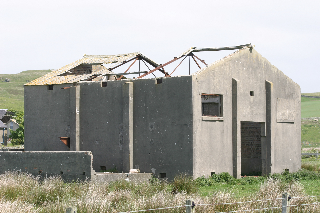

SuperPixels Plot


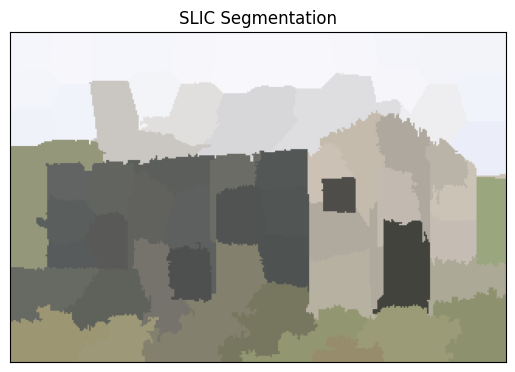

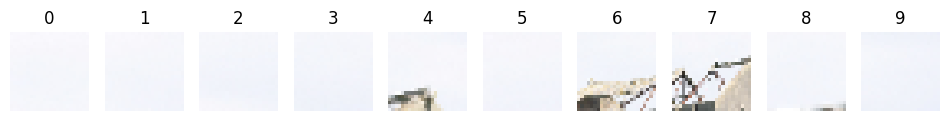

In [ ]:
#@title  RGB+ SLIC Output + Superpixels
### YOUR CODE TO PLOT 12 images (original RGB + superpixel map + first 10 superpixels) ###
import random
index=random.randint(0,len(training_image_list))
output_image= training_image_list[index-1:index]
# output_image=test_list[1:2]
print("Output Images")
cv2_imshow(cv2.imread(output_image[0]))

slic_op_image=slic(cv2.imread(output_image[0]), n_segments=100, compactness=10)

superpixel_plot(cv2.imread(output_image[0]), slic_op_image, title = "SLIC Segmentation")

# print("\n SLIC Output")
# cv2_imshow(slic_op_image)

dir=Path(train_dir)
i=output_image[0]
file_name=i.split("/")[-1]
file_name=file_name.split(".")[0]

patches=sorted([str(file) for file in dir.glob(f'*{file_name}_C*')])
patch_list=[]

for ind in range(0,len(patches)):
    patch=(np.load(patches[ind]))
    patch_list.append((patch))
    if ind>10:
      break

fig, axes = plt.subplots(1, 10, figsize=(12, 6))
k=0
print("SuperPixels Plot")
for i in range(10):
          image = patch_list[k]
          axes[i].imshow(cv2.resize(image,(24,24)))
          axes[i].axis('off')
          axes[i].set_title(i)

          k=k+1
plt.show()

### Question 6: Deep Network (10 points)

You could use a pre-trained network (like VGG) and replace the last few layers with a fully connected layer.

In [ ]:
# Model definition
class SegmentationNN(nn.Module):
    def __init__(self):
        # Your code
        super(SegmentationNN,self).__init__()
        #defining model to use
        self.model= models.resnet50(weights=ResNet50_Weights.DEFAULT)
        for param in self.model.parameters():
            param.requires_grad = False
        for param in self.model.fc.parameters():
            param.requires_grad = True
        num_final_in = self.model.fc.in_features
        self.model.fc = nn.Linear(num_final_in, 10)


    def forward(self,inputdata):
        # Your code
        output=self.model(inputdata)
        return output

### Question 7: Optimizer (10 points)

Finally, we define the classification loss and optimizer such that we can learn a superpixel classifier from the backproporgation algorithm.

In [ ]:
# Optimizer
class Solver(object):
    def __init__(self, model, learning_rate=1e-4,num_epochs=6):
      # Your code
      # pass
      self.model = model
      self.epoch_no=num_epochs
      self.criterion = nn.CrossEntropyLoss()
      self.optimizer = optim.Adam(model.parameters(), lr=learning_rate)
      self.scheduler = ReduceLROnPlateau(self.optimizer, factor=0.00001, patience=5, verbose=True)
      self.epoch_acc = []
      self.epoch_loss = []
      self.current_loss = []

    def train(self, data_loader):
        # Your code
        self.model.train()
        start_time = time.time()
        self.epoch_acc = []
        self.epoch_loss = []
        self.current_loss = []

        for epoch in range(self.epoch_no + 1):
          losses = []
          current_loss = 0
          pred_corr_vals = 0
          samples_done = 0

          batch_loop = tqdm(enumerate(data_loader), total=len(data_loader), leave=True)
          for idx, (image, labels) in batch_loop:

            image,labels = image.to(device=device),labels.to(device=device)
            self.optimizer.zero_grad()

            predicted_labels = self.model(image)

            loss = self.criterion(predicted_labels, labels)
            losses.append(loss.item())

            loss.backward()
            self.optimizer.step()
            _, preds = torch.max(predicted_labels, 1)
            pred_corr_vals += torch.sum(preds == labels)
            samples_done += predicted_labels.size(0)

            batch_loop.set_description(f'Epoch [{epoch}/{self.epoch_no}]')
            batch_loop.set_postfix(loss=loss.item(), acc=(pred_corr_vals/samples_done).item())

            self.current_loss.append(sum(losses)/len(losses))

          loss_avg = sum(losses)/len(losses)
          acc_avg = pred_corr_vals/samples_done
          self.scheduler.step(loss_avg)

          self.epoch_acc.append(acc_avg)
          self.epoch_loss.append(loss_avg)

          time_elapsed = time.time() - start_time
          print('Epoch: [{}/{}] Time: {}min Training Loss: {:.4f} Acc: {:.4f}'.format(epoch, self.epoch_no, time_elapsed//60, loss_avg, acc_avg))
        return self.epoch_loss, self.epoch_acc

    def evaluate(self, data_loader):
        self.model.eval()

        self.epoch_acc = []
        self.epoch_loss = []
        self.current_loss = []

        start_time = time.time()

        for epoch in range(self.epoch_no + 1):
          losses = []
          current_loss = 0
          pred_corr_vals = 0
          samples_done = 0

          batch_loop = tqdm(enumerate(data_loader), total=len(data_loader), leave=True)
          with torch.no_grad():
            for idx, (image, labels) in batch_loop:
              image,labels = image.to(device=device),labels.to(device=device)

              predicted_labels = self.model(image)
              loss = self.criterion(predicted_labels, labels)
              losses.append(loss.item())

              _, preds = torch.max(predicted_labels, 1)

              pred_corr_vals += torch.sum(preds == labels)
              samples_done += predicted_labels.size(0)

              self.current_loss.append(sum(losses)/len(losses))

              batch_loop.set_description(f'Epoch [{epoch}/{self.epoch_no}]')
              batch_loop.set_postfix(acc=(pred_corr_vals/samples_done).item())

          acc_avg = pred_corr_vals/samples_done
          loss_avg = sum(losses)/len(losses)
          self.epoch_acc.append(acc_avg)
          self.epoch_loss.append(loss_avg)

          time_elapsed = time.time() - start_time
          print('Epoch: [{}/{}] Time: {}min Testinging Acc: {:.4f}'.format(epoch, self.epoch_no, time_elapsed//60,acc_avg))
        return self.epoch_loss, self.epoch_acc

### Question 8: Putting it together (50 points)

Train your network and observe the loss in time.
During the inference stage, combine the SLIC Superpixels' predicted labels to form the whole input image's superpixel segmentation results.
The following 4 items are the primary graded components:

1. You must randomly split the whole dataset into train and test subset (80:20 split is fine).
2. You must show the training loss of the classifier after every epoch
3. You must show the training accuracy and test accuracy of the classifier after training.
4. You must plot as least one visualization showing the test segmentation map vs. ground truth segmentation map.

In [ ]:
torch.manual_seed(42)
# load the data
train_data= SegmentationData(path_of_data=dataset_dir,datatype="train",transform=transforms)
test_data=SegmentationData(path_of_data=dataset_dir,datatype="test",transform=transforms)
batch_size = 32
# data loader
train_loader = data.DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = data.DataLoader(dataset=test_data, batch_size=batch_size, shuffle=True, num_workers=2)
# model
model = SegmentationNN().to(device)
solver = Solver(model,learning_rate=1e-3,num_epochs=6)
# train the model
train_loss, train_acc = solver.train(train_loader)
test_loss,test_acc = solver.evaluate(val_loader)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 181MB/s]
Epoch [0/6]: 100%|██████████| 359/359 [00:50<00:00,  7.15it/s, acc=0.686, loss=1.05]

Epoch: [0/6] Time: 0.0min Training Loss: 0.9346 Acc: 0.6863



Epoch [1/6]: 100%|██████████| 359/359 [00:43<00:00,  8.22it/s, acc=0.773, loss=0.592]

Epoch: [1/6] Time: 1.0min Training Loss: 0.6409 Acc: 0.7731



Epoch [2/6]: 100%|██████████| 359/359 [00:44<00:00,  8.14it/s, acc=0.794, loss=0.45]

Epoch: [2/6] Time: 2.0min Training Loss: 0.5764 Acc: 0.7945



Epoch [3/6]: 100%|██████████| 359/359 [00:44<00:00,  8.14it/s, acc=0.805, loss=0.468]

Epoch: [3/6] Time: 3.0min Training Loss: 0.5369 Acc: 0.8054



Epoch [4/6]: 100%|██████████| 359/359 [00:43<00:00,  8.22it/s, acc=0.811, loss=0.46]

Epoch: [4/6] Time: 3.0min Training Loss: 0.5109 Acc: 0.8109



Epoch [5/6]: 100%|██████████| 359/359 [00:45<00:00,  7.89it/s, acc=0.824, loss=0.702]

Epoch: [5/6] Time: 4.0min Training Loss: 0.4827 Acc: 0.8244



Epoch [6/6]: 100%|██████████| 359/359 [00:43<00:00,  8.16it/s, acc=0.824, loss=0.699]

Epoch: [6/6] Time: 5.0min Training Loss: 0.4815 Acc: 0.8237



Epoch [0/6]: 100%|██████████| 93/93 [00:11<00:00,  8.37it/s, acc=0.818]

Epoch: [0/6] Time: 0.0min Testinging Acc: 0.8185



Epoch [1/6]: 100%|██████████| 93/93 [00:10<00:00,  8.47it/s, acc=0.819]

Epoch: [1/6] Time: 0.0min Testinging Acc: 0.8188



Epoch [2/6]: 100%|██████████| 93/93 [00:11<00:00,  8.44it/s, acc=0.816]

Epoch: [2/6] Time: 0.0min Testinging Acc: 0.8161



Epoch [3/6]: 100%|██████████| 93/93 [00:10<00:00,  8.93it/s, acc=0.815]

Epoch: [3/6] Time: 0.0min Testinging Acc: 0.8148



Epoch [4/6]: 100%|██████████| 93/93 [00:10<00:00,  8.62it/s, acc=0.825]

Epoch: [4/6] Time: 0.0min Testinging Acc: 0.8246



Epoch [5/6]: 100%|██████████| 93/93 [00:10<00:00,  8.46it/s, acc=0.821]

Epoch: [5/6] Time: 1.0min Testinging Acc: 0.8212



Epoch [6/6]: 100%|██████████| 93/93 [00:11<00:00,  8.43it/s, acc=0.811]

Epoch: [6/6] Time: 1.0min Testinging Acc: 0.8114


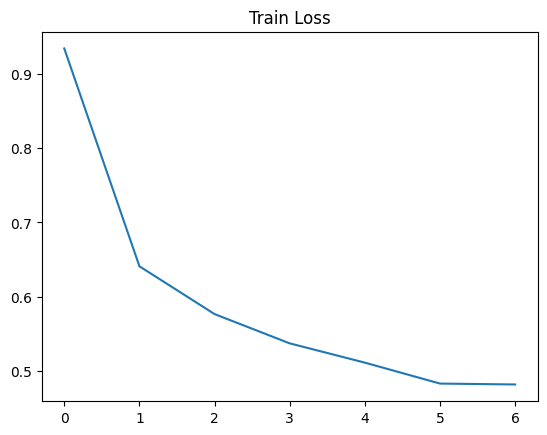

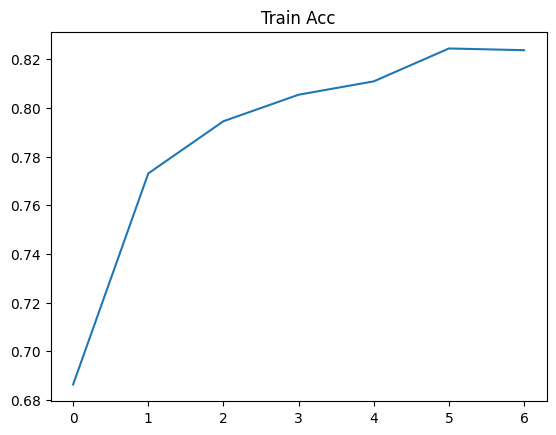

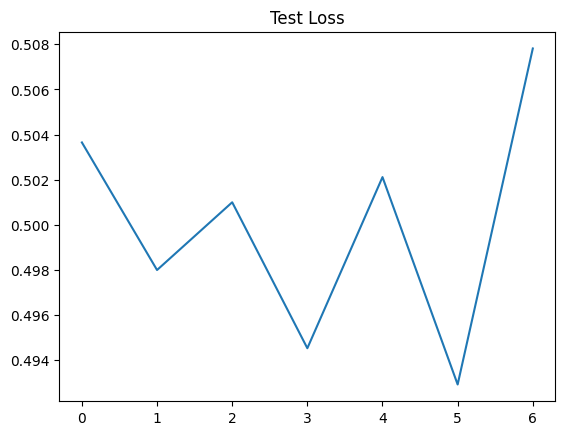

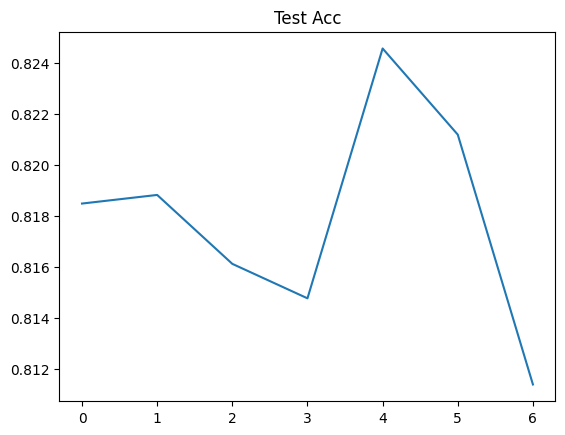

In [ ]:
plt.plot(train_loss)
plt.title("Train Loss")
plt.show()
abc= [i.to("cpu") for i in train_acc ]
print("\n")
plt.plot(abc)
plt.title("Train Acc")
plt.show()
print("\n")
plt.plot(test_loss)
plt.title("Test Loss")
plt.show()
print("\n")
abc= [i.to("cpu") for i in test_acc ]
print("\n")
plt.plot(abc)
plt.title("Test Acc")
plt.show()

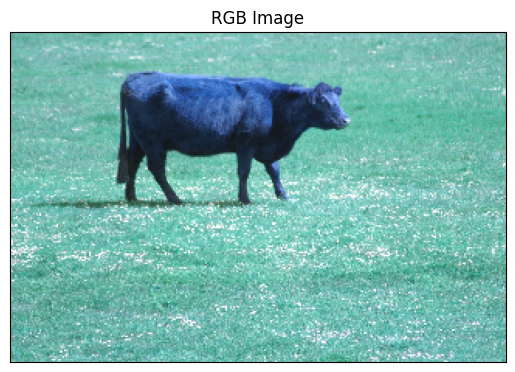

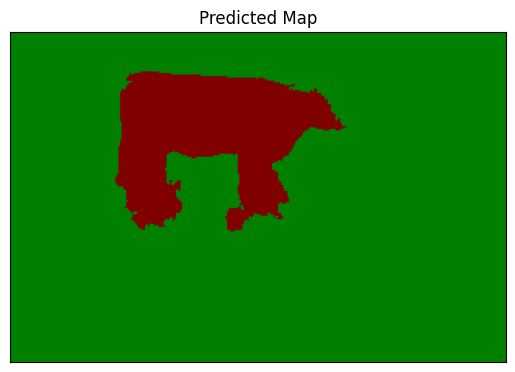

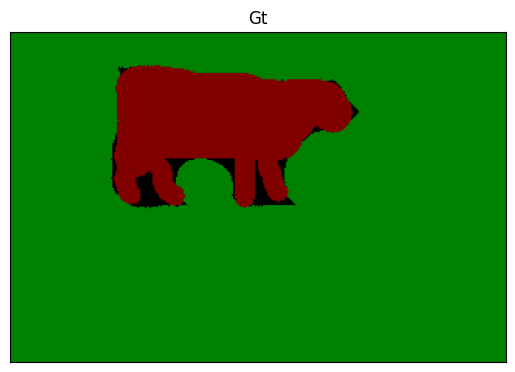

In [ ]:
import random

img_idx = random.randint(1, len(testing_image_list))

for key in label_2_rgb.keys():
    if key == -1:
      label_2_rgb[9] = label_2_rgb.pop(key)

image = cv2.imread(testing_image_list[img_idx])
gt = cv2.imread(test_gt_list[img_idx])
image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
gt=cv2.cvtColor(gt,cv2.COLOR_BGR2RGB)

pred_seg_map = np.zeros(image.shape, dtype=np.uint8)
model.eval()

def get_slic_patch(image,num_superpixels=100,n_dilate=3):
        #SLIC
        slic_image= slic(image, n_segments=num_superpixels, compactness=10)

        # for all superpixels found
        for ptr in range(0,num_superpixels):
            location=np.where(slic_image==ptr)
            h,w=slic_image.shape
            #making sure pixel coordinate is not at zero
            if(len(location[0]) != 0):
              xmin, ymin = min(location[1]), min(location[0])
              xmax, ymax = max(location[1]), max(location[0])

              #dilate
              x_min,x_max,y_min,y_max=dilate_rect(xmin, ymin,xmax, ymax,w,h,n_dilate)

              (y1, x1), (y2, x2) = (ymin, xmin), (ymax, xmax)
              image_patch= image[y1:y2, x1:x2, :]
              image_patch= transforms(image_patch).to(device)
              image_patch=image_patch.unsqueeze(0)
              predicted_label=model(image_patch)
              _, predicted = torch.max(predicted_label, 1)

              ind = (slic_image == ptr)
              pred_seg_map[ind]=label_2_rgb[predicted.item()]


get_slic_patch(image,num_superpixels=100,n_dilate=3)
plot_image(image,"RGB Image")
plot_image(pred_seg_map,"Predicted Map")
plot_image(gt,"Gt")

### Question 9: Bonus Question (20 points, OPTIONAL):

IMPORTANT: No matter which option you choose, you can earn a maximum of 20 points for this section.

We always want to increase the classifier accuracy and achieve a better performance by building a complicated deep learning model. There are a lot of tricks which are very popular and work in practice. Try to implement either of following two,

1. Could you effictively fuse different deep features from multiple layers in your network? You are welcome to use the pretrained network. Does your network achieve a better accuracy? There are a lot of exploration in the literature, including ION (Inside-Outside Net) [1], Hypercolumns [2], and PixelNet [3]. The following figure illustrates ION architecture combining features from different layers. Can you do similar thing for our Superpixel classifier?

2. Could you build a Multi-resolution network to explore the effectiveness of the multi-scale on the task of Superpixels segmentation? By multi-scale, we mean multiple resolutions of superpixels. See [4] for an example.

[1] Inside-Outside Net: Detecting Objects in Context with Skip Pooling and Recurrent Neural Networks

[2] Hypercolumns for Object Segmentation and Fine-grained Localization

[3] PixelNet: Representationofthe pixels, by the pixels, and for the pixels

[4] Feedforward semantic segmentation with zoom-out features

In [ ]:
# Bonus
